# 🗳️ Elecciones EEUU

🧑‍💻 Lucía Cordero | Jorge Garcelán

![Election Results](https://www.porunmundomasjusto.es/wp-content/uploads/2020/11/mundomasjusto.png)


<div class="warning" style='padding:0.1em; border-left: 4px solid #17a2b8; background-color:#e8f8ff;'>
<span>
<p style='margin-top:1em; margin-left:1em; text-align:left'>
<b>🎯Motivación y Objetivos</b></p>
<p style='margin-left:1em;'>
Este proyecto de análisis de datos está basado en los resultados de las <strong>elecciones presidenciales de Estados Unidos de 2020</strong>. Inspirados por nuestro interés en la política y teniendo en cuenta que las elecciones presidenciales de EE.UU. de 2024 son el 5 de noviembre, se nos ocurrió abordar este tema.
<br><br>
    El objetivo es aplicar técnicas de <strong>aprendizaje supervisado</strong> y <strong>no supervisado</strong> para explorar patrones y tendencias, así como predecir los resultados electorales en función de las características socioeconómicas y demográficas de cada condado. Este enfoque nos permite estudiar cómo estos factores influyen en los comportamientos de los votantes y cómo podrían anticiparse los resultados de futuras elecciones.
</p>
</span>
</div>

<div style="border-left: 4px solid #ffa500; background-color: #fff4e5; padding: 10px;">
    <strong>⚠️Warning:</strong> Es importante mencionar que no hemos podido utilizar los datos de 2024 como test pues no se encuentran disponibles todavía.
</div>


## Librerías

In [4]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.graph_objs as go
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression


## Datasets

### Seleccionar año

In [9]:
CENSUS_YEAR = 2015 # 2015, 2019, 2023
ELECTORAL_YEAR = CENSUS_YEAR + 1

### Cargar datos

In [10]:
data = pd.read_csv(f'data/final_data_{ELECTORAL_YEAR}.csv')

## Análisis Exploratorio de Datos

#### Correlación

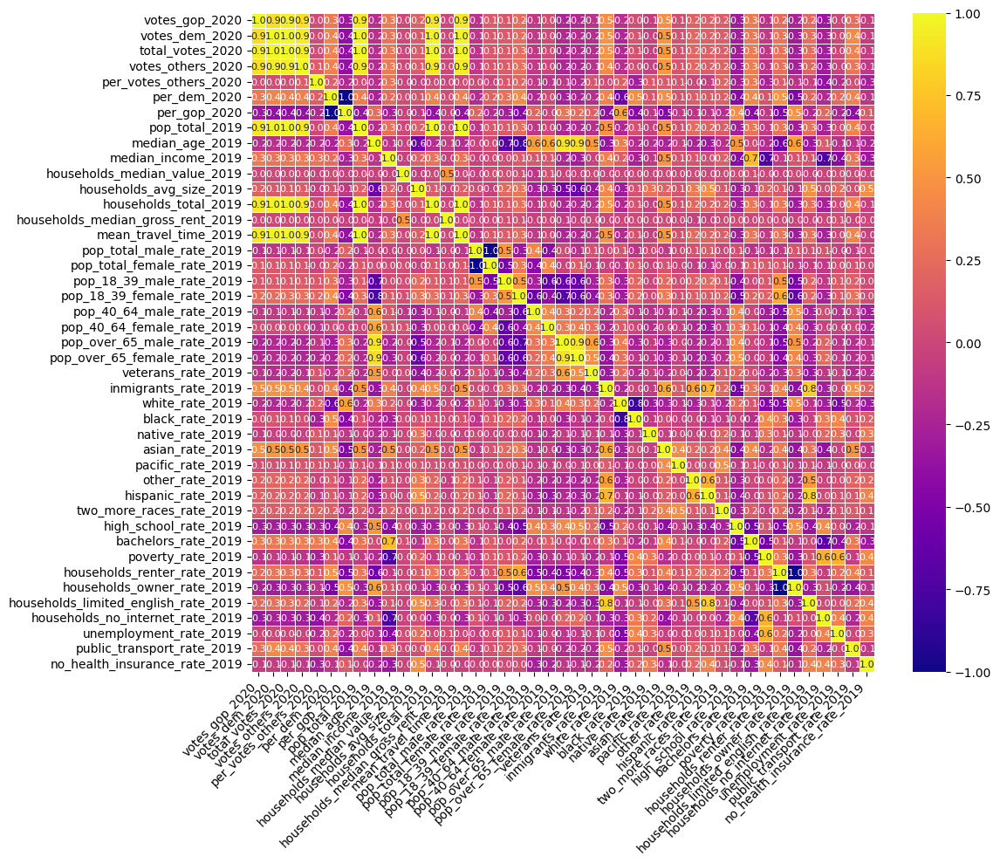

In [34]:
# Calcular la matriz de correlación sin la variable "Winner_2020"
corr_matrix = data.iloc[:, :-1].corr()

# Crear un mapa de calor de la matriz de correlación con etiquetas ajustadas
plt.figure(figsize=(12, 10))  # Aumentar el tamaño del gráfico
sns.heatmap(corr_matrix, annot=True, cmap="plasma", fmt=".1f", linewidths=0.5, annot_kws={"size": 8})

# Rotar las etiquetas del eje X y ajustar el layout
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)  # Mantener las etiquetas del eje Y rectas

# Ajustar el layout para que no se corten las etiquetas
plt.tight_layout()

# Guardar el gráfico como PNG con fondo transparente
plt.savefig(f"imgs/corr_plot_{ELECTORAL_YEAR}.png", format="png", transparent=True)

# Mostrar el gráfico
plt.show()

#### Ganador por condado

In [35]:
plot_data = data.copy()
plot_data['state'] = state_names
plot_data

,votes_gop_2020,votes_dem_2020,total_votes_2020,votes_others_2020,per_votes_others_2020,per_dem_2020,per_gop_2020,pop_total_2019,median_age_2019,median_income_2019,...,poverty_rate_2019,households_renter_rate_2019,households_owner_rate_2019,households_limited_english_rate_2019,households_no_internet_rate_2019,unemployment_rate_2019,public_transport_rate_2019,no_health_insurance_rate_2019,winner_2020,state
0,19838.0,7503.0,27770.0,429.0,0.015448,0.270184,0.714368,55380,38.2,58731,...,15.06,26.71,73.29,0.72,17.21,3.68,0.29,6.96,gop,Alabama
1,83544.0,24578.0,109679.0,1557.0,0.014196,0.224090,0.761714,212830,43.0,58320,...,10.20,24.75,75.25,1.19,13.82,4.26,0.02,8.78,gop,Alabama
2,5622.0,4816.0,10518.0,80.0,0.007606,0.457882,0.534512,25361,40.4,32525,...,27.11,39.10,60.90,1.62,32.61,9.17,0.11,10.03,gop,Alabama
3,7525.0,1986.0,9595.0,84.0,0.008755,0.206983,0.784263,22493,40.9,47542,...,16.63,25.58,74.42,0.58,26.75,7.28,0.00,9.79,gop,Alabama
4,24711.0,2640.0,27588.0,237.0,0.008591,0.095694,0.895716,57681,40.7,49358,...,13.42,21.22,78.78,1.77,23.90,3.36,0.05,10.68,gop,Alabama
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3108,12229.0,3823.0,16603.0,551.0,0.033187,0.230260,0.736554,43521,35.3,74843,...,11.31,23.78,76.22,1.93,11.00,6.09,1.41,11.18,gop,Wyoming
3109,4341.0,9848.0,14677.0,488.0,0.033249,0.670982,0.295769,23280,39.3,84678,...,6.13,39.59,60.41,5.65,8.01,1.08,2.12,12.71,dem,Wyoming
3110,7496.0,1591.0,9402.0,315.0,0.033504,0.169219,0.797277,20479,35.8,63403,...,11.22,22.94,77.06,0.63,8.35,6.28,1.47,11.09,gop,Wyoming
3111,3245.0,651.0,4012.0,116.0,0.028913,0.162263,0.808824,8027,42.9,54158,...,10.28,23.51,76.49,1.25,16.02,3.92,0.00,14.73,gop,Wyoming


In [36]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'winner_{ELECTORAL_YEAR}',
                    hover_name=county_names,
                    scope='usa',  # Mostrar todo Estados Unidos
                    color_discrete_map={
                        "dem": "#3951a2",
                        "gop": "#af2b39"
                    }
                )

# Ajustar el tamaño y márgenes del gráfico
fig.update_layout(
    title_text="Ganador por condado",
    title_x=0.5,  # Centrar el título
    width=900,   # Aumentar el ancho del gráfico
    height=600,  # Aumentar la altura del gráfico
    margin={"r":0,"t":50,"l":0,"b":0},  # Ajustar márgenes para que no se corte
    paper_bgcolor='rgba(0,0,0,0)',  # Fondo transparente
    plot_bgcolor='rgba(0,0,0,0)'   # Fondo transparente
)

# Ajustar la visualización geográfica
fig.update_geos(
    fitbounds="locations",  # Ajustar el mapa según las ubicaciones FIPS
    visible=False  # Ocultar detalles de la costa y otras líneas exteriores
)

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)


# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.3, marker_line_color="black")

# Mostrar el gráfico
fig.show()


#### Población

##### Población total

In [37]:
plot_data[f'log_pop_total_{CENSUS_YEAR}'] = np.log(plot_data[f'pop_total_{CENSUS_YEAR}'])

# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'log_pop_total_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución del número de habitantes (log) por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS
# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


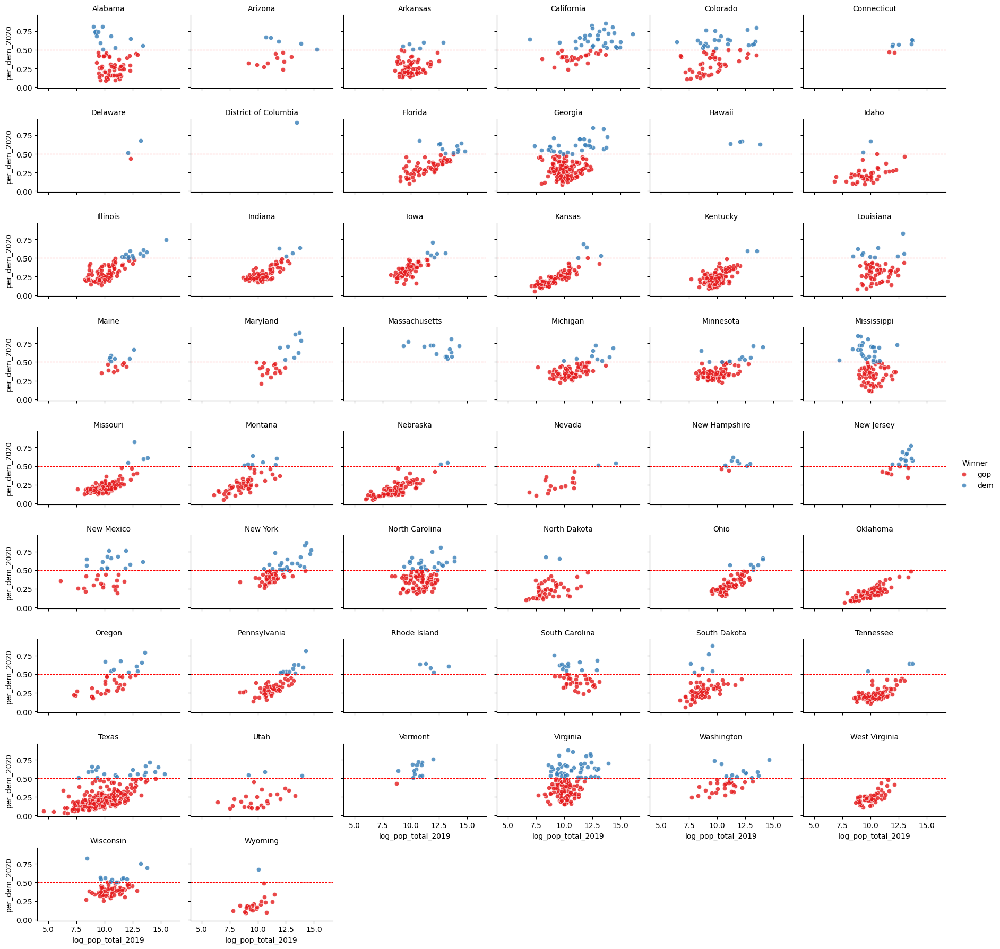

In [38]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f'log_pop_total_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)


g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'log_pop_total_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

##### Edad Mediana de la Población

In [39]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'median_age_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la edad (mediana) por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


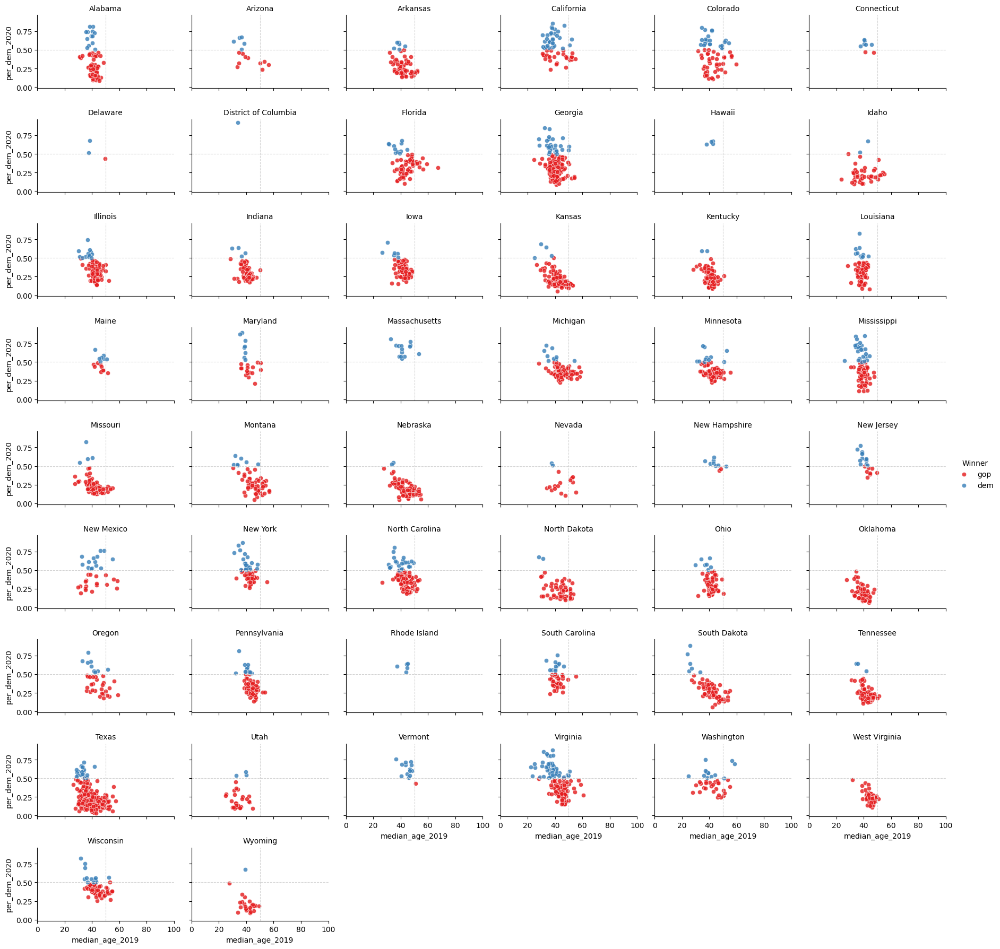

In [40]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='lightgray', lw=0.8)  # Línea horizontal en 50%
    ax.axvline(50, ls='--', color='lightgray', lw=0.8)  # Línea vertical en 50
    ax.set_xlim(0, 100)  # Ajustar el eje X hasta 100


# Scatterplot
g.map(sns.scatterplot, f'median_age_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)


g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'median_age_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

##### Porcentaje de hombres por condado

In [41]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'pop_total_male_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución del porcentaje de hombres por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


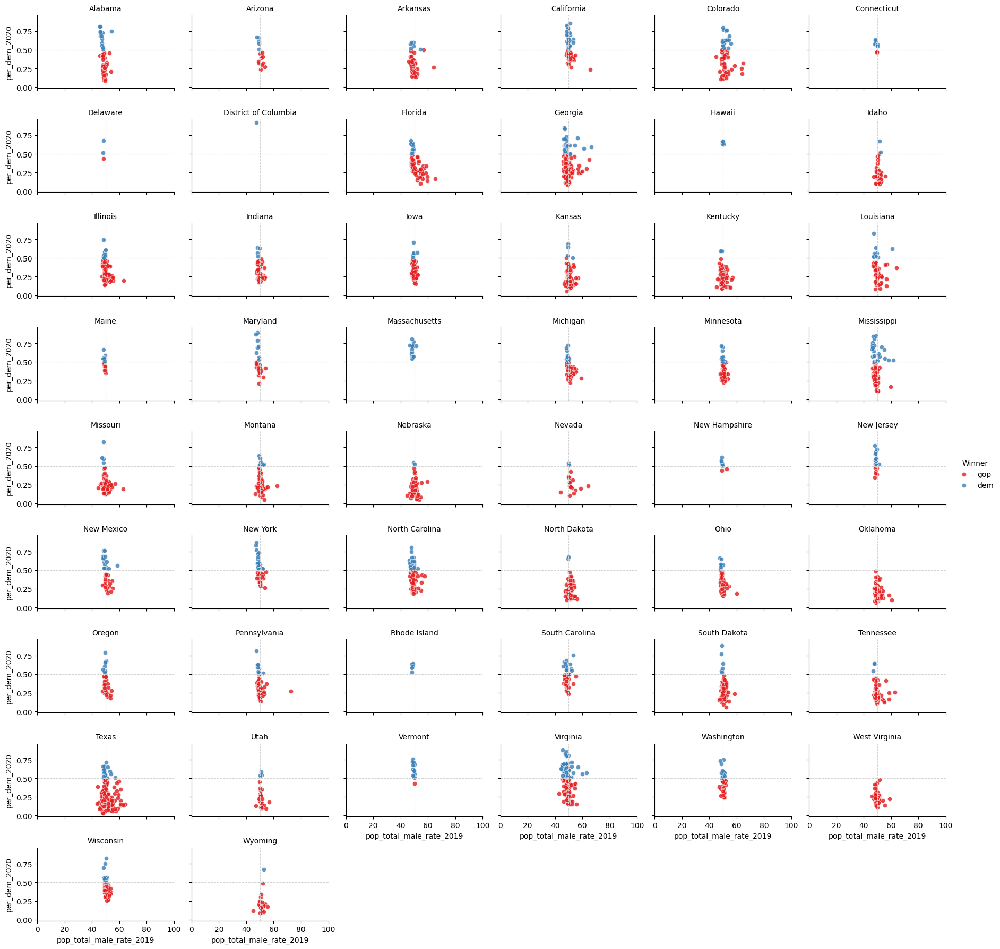

In [42]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})

    # Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='lightgray', lw=0.8)  # Línea horizontal en 50%
    ax.axvline(50, ls='--', color='lightgray', lw=0.8)  # Línea vertical en 50
    ax.set_xlim(0, 100)  # Ajustar el eje X hasta 100


# Scatterplot
g.map(sns.scatterplot, f'pop_total_male_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'pop_total_male_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

##### Porcentaje de mujeres por condado

In [43]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'pop_total_female_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución del porcentaje de hombres por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


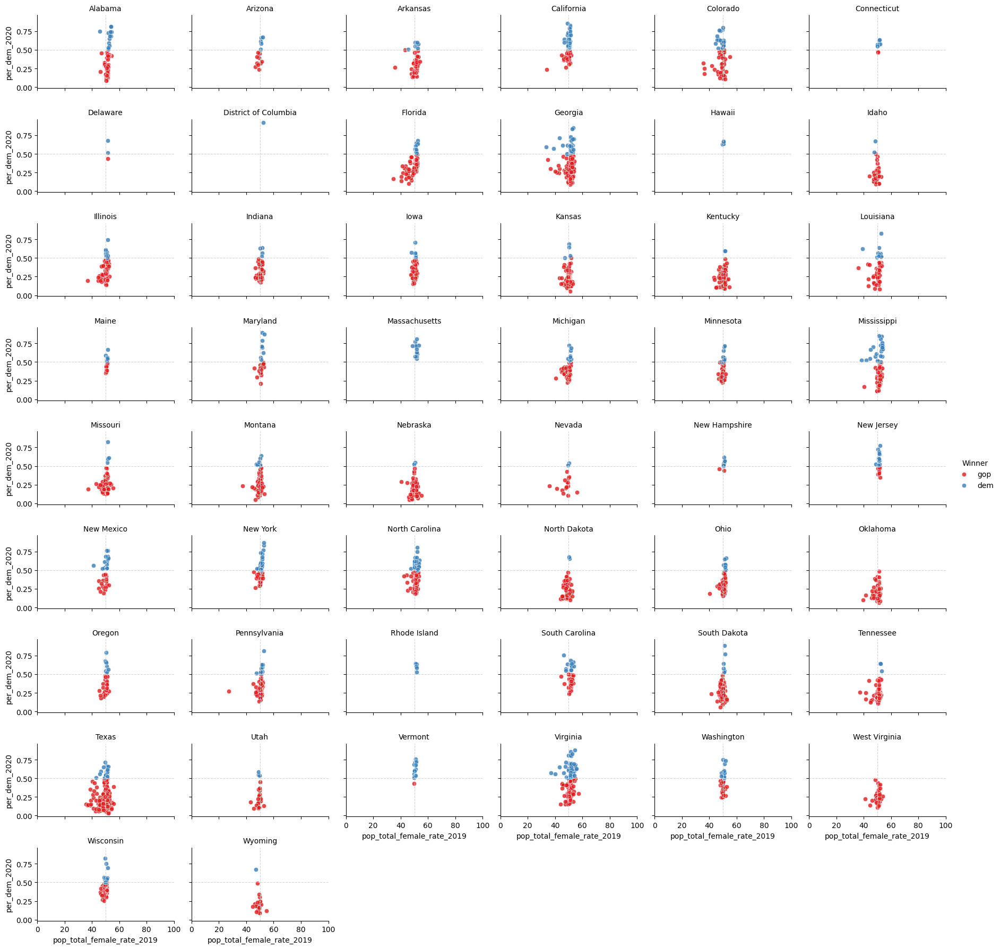

In [44]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='lightgray', lw=0.8)  # Línea horizontal en 50%
    ax.axvline(50, ls='--', color='lightgray', lw=0.8)  # Línea vertical en 50
    ax.set_xlim(0, 100)  # Ajustar el eje X hasta 100


# Scatterplot
g.map(sns.scatterplot, f'pop_total_female_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)



g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'pop_total_female_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

#### Educación

##### Porcentaje de población con título de secundaria (High School) por condado

In [45]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'high_school_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Dsitribución de la población con título de secundaria por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


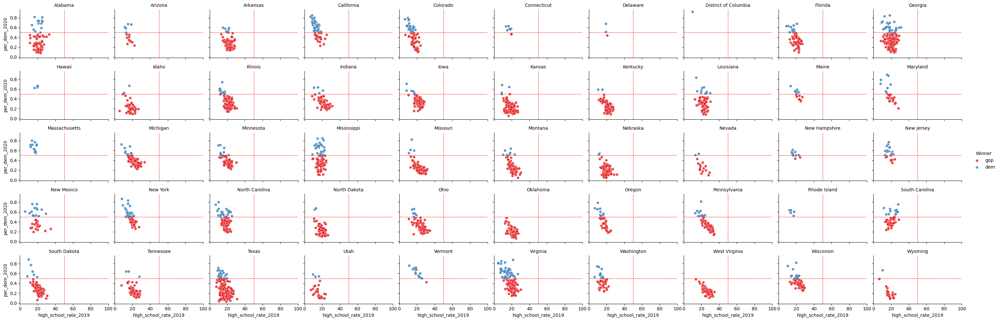

In [46]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f'high_school_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='red', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'high_school_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

##### Porcentaje de población con título universitario (Bachelors) por condado

In [47]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'bachelors_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Dsitribución de la población con título universitario por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


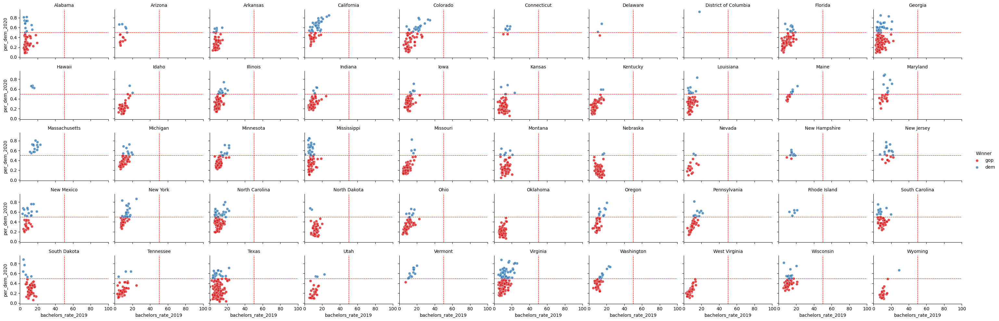

In [48]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f'bachelors_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='red', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'bachelors_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

#### Raza y Etnia

##### Porcentaje de población blanca (White) por condado

In [49]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'white_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la población blanca por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


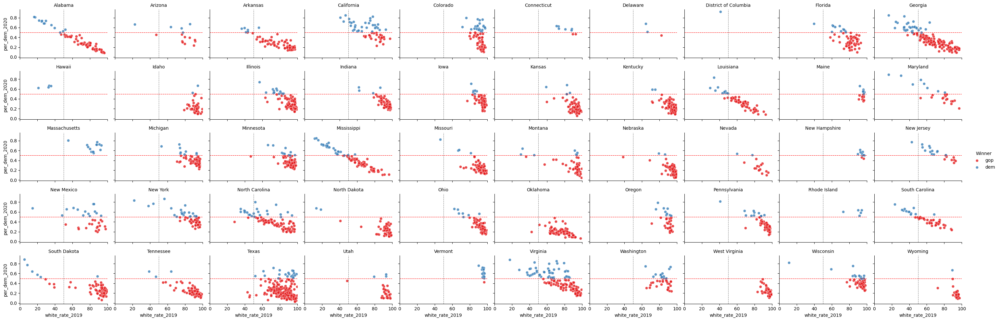

In [50]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f"white_rate_{CENSUS_YEAR}", f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f"white_rate_{CENSUS_YEAR}", f'per_dem_{ELECTORAL_YEAR}')

plt.show()

##### Porcentaje de población negra (Black) por condado

In [51]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'black_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la población negra por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


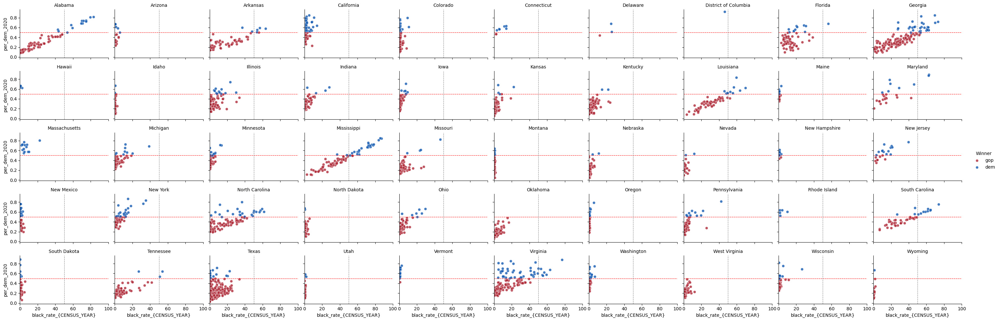

In [52]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#af2b39", "dem": "#145bb2"})
g.map(sns.scatterplot, f'black_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels('black_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

##### Porcentaje de población hispana (Hispanic) por condado

In [53]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'hispanic_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la población hispana por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


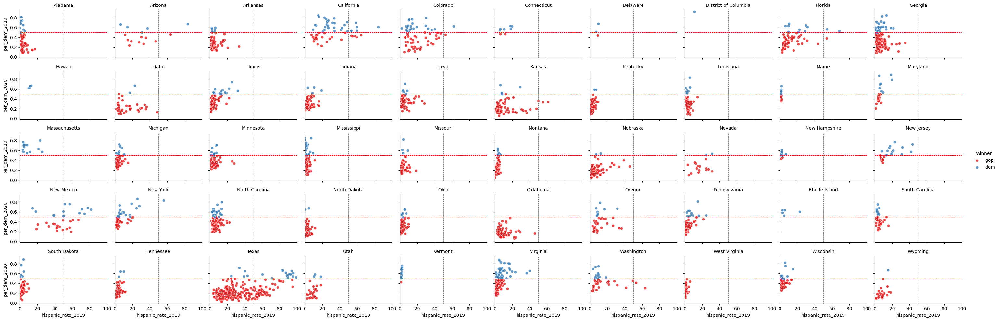

In [54]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f"hispanic_rate_{CENSUS_YEAR}", f"per_dem_{ELECTORAL_YEAR}", alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f"hispanic_rate_{CENSUS_YEAR}", f"per_dem_{ELECTORAL_YEAR}")

plt.show()

##### Porcentaje de población asiática (Asian) por condado

In [55]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'asian_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la población asiática por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


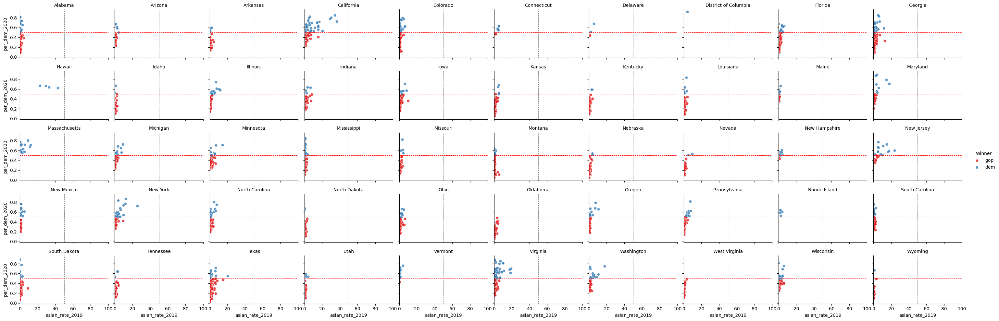

In [56]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f'asian_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'asian_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

##### Porcentaje de población nativa (Native) por condado

In [57]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'native_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la población nativa por condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


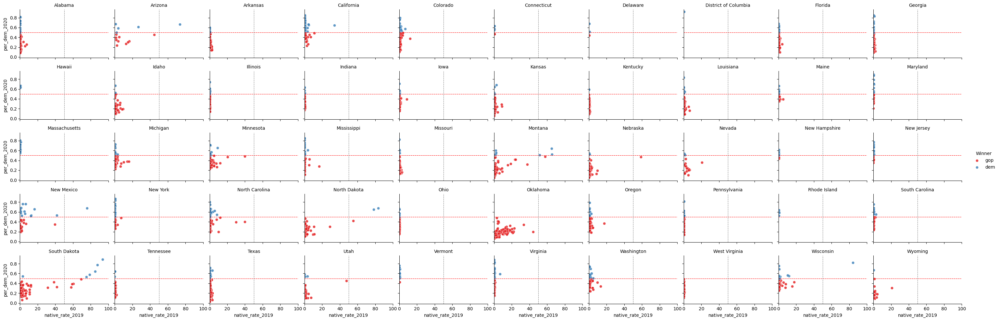

In [58]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=10, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f'native_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)
    ax.axvline(50, ls='--', color='gray', lw=0.8)
    ax.set_xlim(0, 100)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'native_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

#### Economía

##### Median income

In [59]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'median_income_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la renta per capita por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS
# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


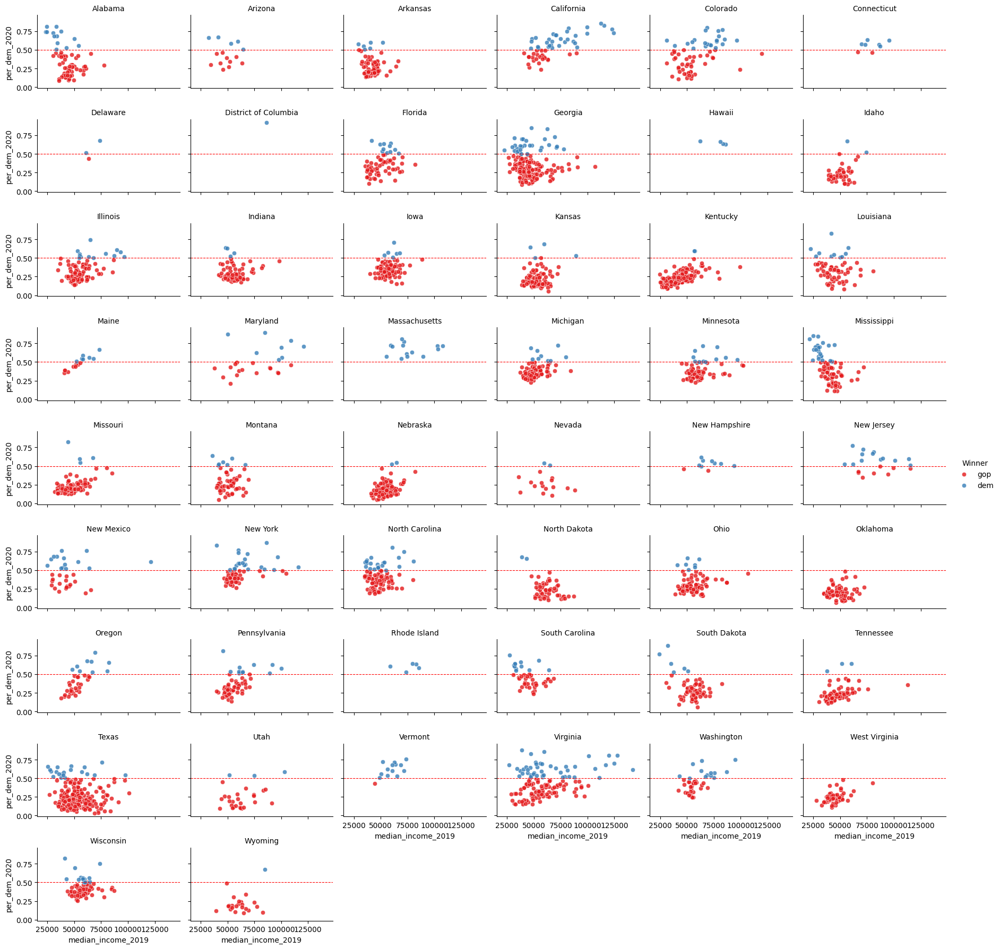

In [60]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f'median_income_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'median_income_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

##### Tasa de Desempleo

In [61]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'unemployment_rate_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución de la tasa de desempleo por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


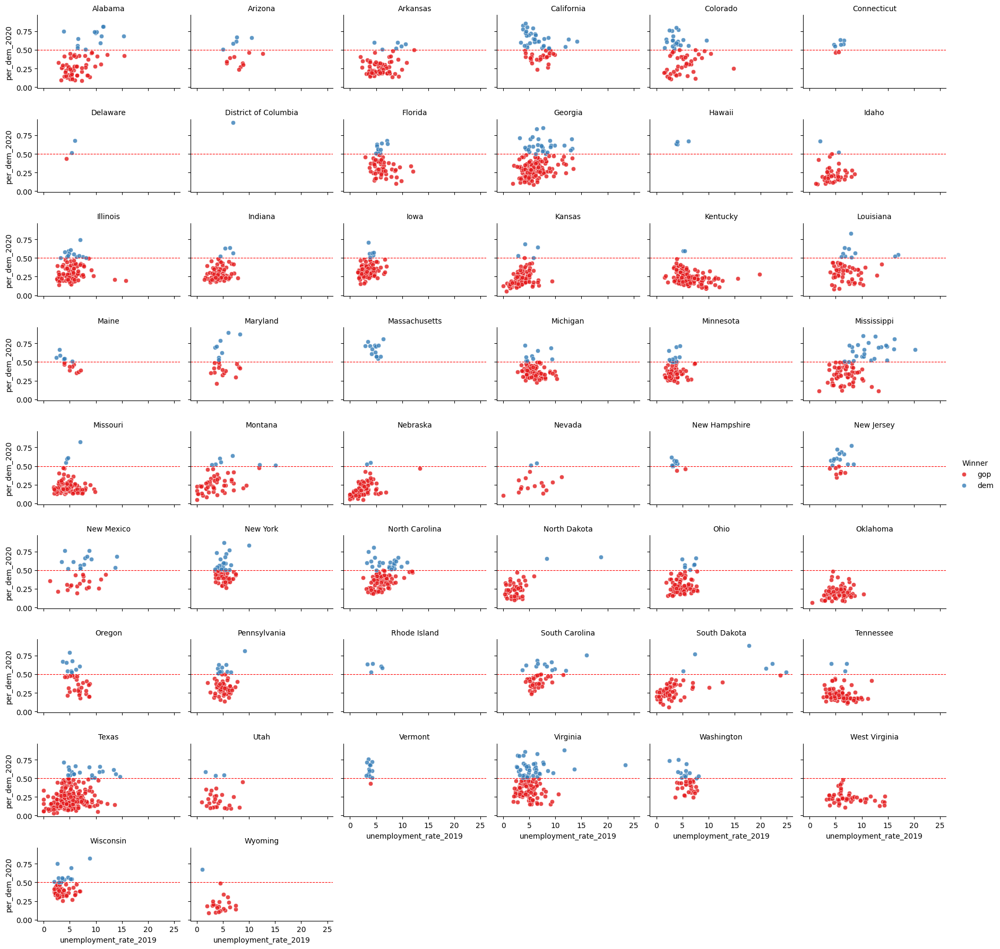

In [62]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f'unemployment_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'unemployment_rate_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()

#### Tamaño medio de familia

In [63]:
# Crear un mapa coroplético (choropleth) usando Plotly Express
fig = px.choropleth(data_frame=plot_data,
                    geojson='https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json',
                    locations=fips_codes,
                    color=f'households_avg_size_{CENSUS_YEAR}',
                    hover_name=county_names,
                    scope='usa'
                   )

# Añadir título y configuración geográfica
fig.update_layout(title_text="Distribución del tamaño medio de familia por cada condado",
                  title_x=0.5,  # Centrar el título
                  )

# Ajustar el tamaño del gráfico
fig.update_layout(
    width=1200,  # Ajustar el ancho del gráfico
    height=800   # Ajustar la altura del gráfico
)

# Ajustar la visualización geográfica
fig.update_geos(fitbounds="locations", visible=False)  # Ajustar el mapa según las ubicaciones FIPS

# Quitar las líneas divisorias entre los condados
fig.update_traces(marker_line_width=0.5, marker_line_color="black")

# Mostrar el gráfico
fig.show()


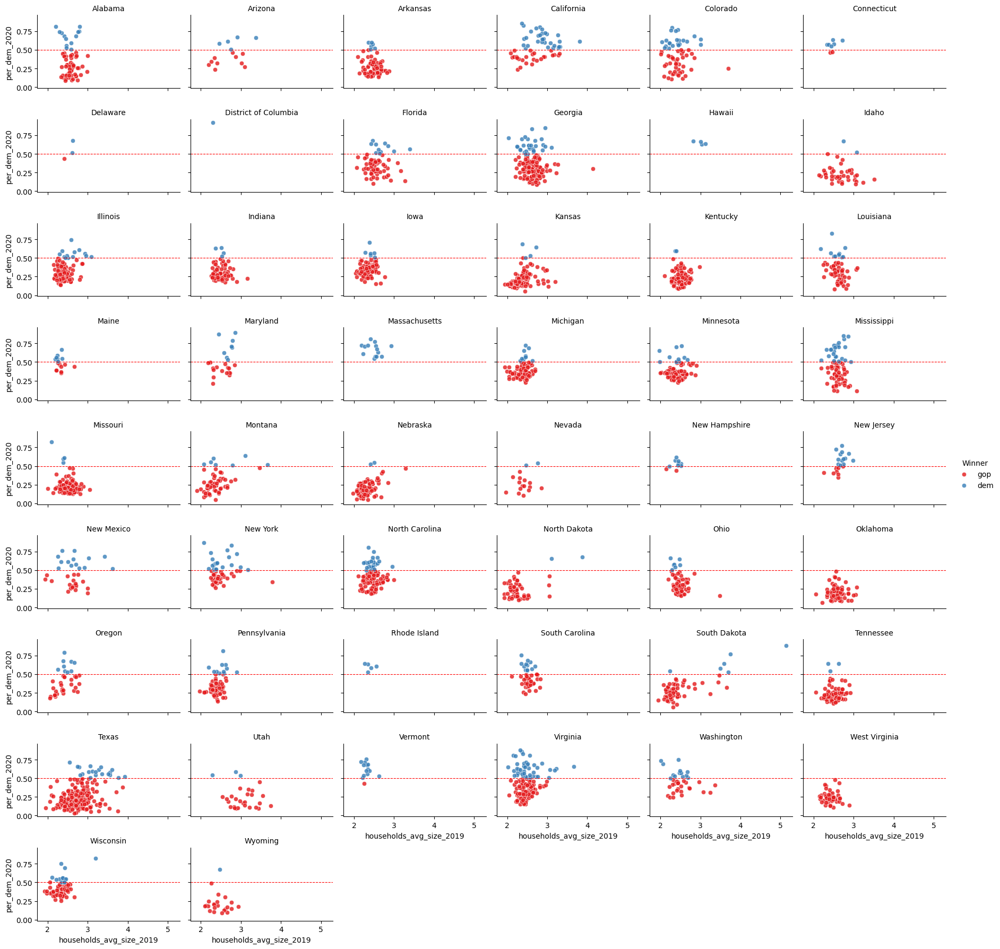

In [64]:
# Crear gráfico facetgrid
g = sns.FacetGrid(plot_data, col='state', hue=f"winner_{ELECTORAL_YEAR}", col_wrap=6, height=2, aspect=1.5, palette={"gop": "#e41a1c", "dem": "#377eb8"})
g.map(sns.scatterplot, f'households_avg_size_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}', alpha=0.8)

# Añadir lineas horizontales y verticales al porcentaje 50%
for ax in g.axes.flat:
    ax.axhline(0.50, ls='--', color='red', lw=0.8)

g.add_legend(title="Winner")
g.set_titles("{col_name}")
g.set_axis_labels(f'households_avg_size_{CENSUS_YEAR}', f'per_dem_{ELECTORAL_YEAR}')

plt.show()